<a href="https://colab.research.google.com/github/Mithunjha/Segmentation/blob/main/UNET_for_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [1]:

import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline
!pip install itk
import itk
from glob import glob
from skimage.transform import resize


import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader
from torch.utils.data import Dataset


     |████████████████████████████████| 16.6 MB 6.7 MB/s 
     |████████████████████████████████| 20.3 MB 1.3 MB/s 
     |████████████████████████████████| 95.3 MB 35 kB/s 
     |████████████████████████████████| 54.5 MB 1.2 MB/s 
     |████████████████████████████████| 15.0 MB 45.2 MB/s 
     |████████████████████████████████| 70.6 MB 11 kB/s 


In [2]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [3]:
data_list = glob('/content/drive/MyDrive/Brats2018/*')
print(len(data_list))

15


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

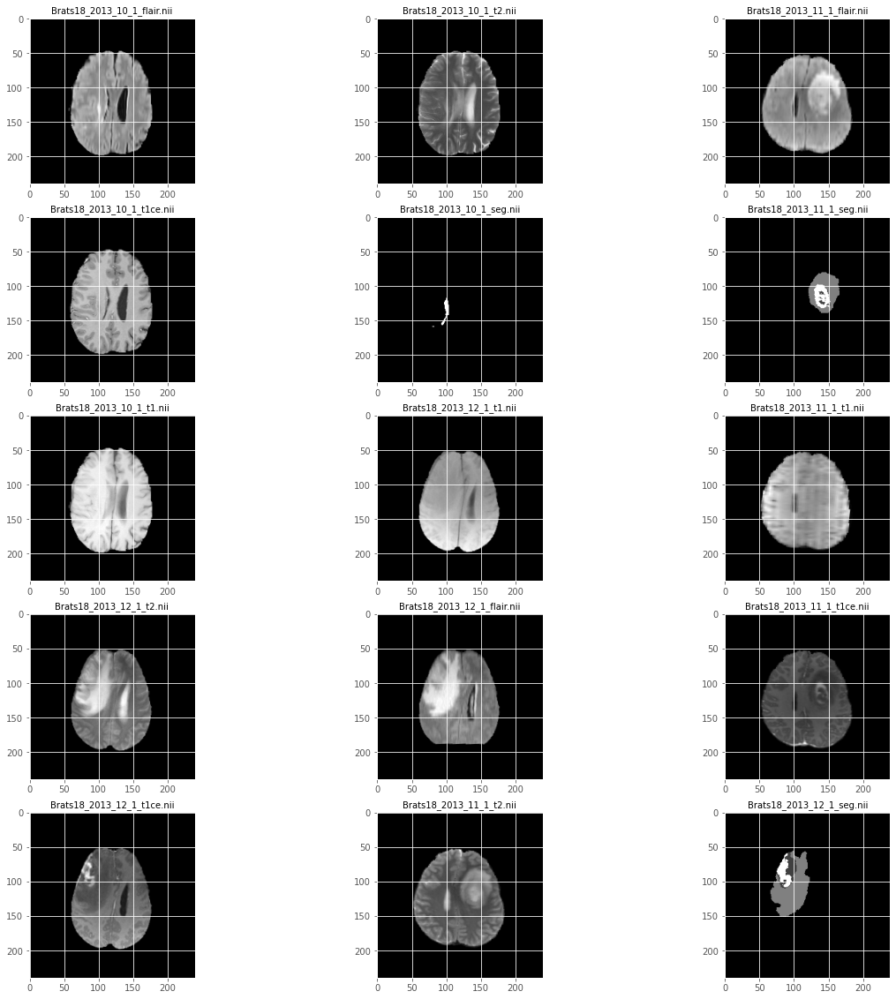

In [ ]:
rows,cols=5,3
slice = 100
fig=plt.figure(figsize=(20,20))
for i in range(1,rows*cols+1):
    fig.add_subplot(rows,cols,i)
    img_path=data_list[i-1]
    img=itk.imread(img_path)
    plt.imshow(img[slice],cmap='gray')
    plt.title(f"{data_list[i-1][33:]}",fontsize = 10)
plt.show()

In [5]:
def rescale_image(image, is_np = True):
  image = itk.array_from_image(image)
  img = (image/np.max(image))*255
  return image

In [6]:
class BRATS_Dataset(Dataset):
  
    def __init__(self, data_list, device,  transform=None, target_transform=None):
        
        self.device = device
        self.transform = transform
        self.target_transform = target_transform

        first = True
        for path in data_list:

          flair_fn = path[:51] + 'flair.nii'
          t1_fn = path[:51]  + 't1.nii'
          t1ce_fn = path[:51]  + 't1ce.nii'
          t2_fn = path[:51]  + 't2.nii'
          seg_fn = path[:51]  + 'seg.nii'
          
          self.flair = np.empty((1,240,240))
          self.t1 = np.empty((1,240,240))
          self.t1ce = np.empty((1,240,240))
          self.t2 = np.empty((1,240,240))
          self.seg = np.empty((1,240,240))
       
          self.flair = np.concatenate((self.flair,rescale_image(itk.imread(flair_fn))),axis = 0)
          self.t1 = np.concatenate((self.t1,rescale_image(itk.imread(t1_fn))),axis = 0)
          self.t1ce = np.concatenate((self.t1ce,rescale_image(itk.imread(t1ce_fn))),axis = 0)
          self.t2 = np.concatenate((self.t2,rescale_image(itk.imread(t2_fn))),axis = 0)
          self.seg = np.concatenate((self.seg,rescale_image(itk.imread(seg_fn))),axis = 0)

        self.seg[self.seg > 0] = 1

    
    def __len__(self):
        return len(self.flair)

    def __getitem__(self, idx):
      flair_resized = resize(self.flair[idx].reshape(1,240,240),(1,256,256))
      t1_resized = resize(self.t1[idx].reshape(1,240,240),(1,256,256))
      t1ce_resized = resize(self.t1ce[idx].reshape(1,240,240),(1,256,256))
      t2_resized = resize(self.t2[idx].reshape(1,240,240),(1,256,256))
      image = np.concatenate((flair_resized,t1_resized,t1ce_resized,t2_resized),axis = 0)
      label = resize(self.seg[idx],(256,256))
      # img = np.moveaxis(img,1,2)  
      if self.transform:
        # Random horizontal flipping
        # if random.random() > 0.5:
        #   image = TF.hflip(image)
        #   label = TF.hflip(label)
        image = self.transform(image)

      #print(f"Shape of Data : {img.shape} , Shape of Labels : {self.label.shape}")
     
      return image, label

In [7]:
val_list = glob('/content/drive/MyDrive/Brats2018/Brats18_2013_10_1_*flair.nii')
print(val_list)

train_list = glob('/content/drive/MyDrive/Brats2018/Brats18_2013_11_1_*flair.nii')
train_list+=((glob('/content/drive/MyDrive/Brats2018/Brats18_2013_12_1_*flair.nii')))
print(train_list)

['/content/drive/MyDrive/Brats2018/Brats18_2013_10_1_flair.nii']
['/content/drive/MyDrive/Brats2018/Brats18_2013_11_1_flair.nii', '/content/drive/MyDrive/Brats2018/Brats18_2013_12_1_flair.nii']


In [8]:
trainset = BRATS_Dataset(data_list = train_list, 
                          device = device, 
                          transform=transforms.Compose([transforms.ToTensor(),
                          transforms.Normalize((0.5,), (0.5,)),]),
                          target_transform=transforms.ToTensor(),) 

valset = BRATS_Dataset(data_list = val_list, 
                          device = device, 
                          transform=transforms.Compose([transforms.ToTensor(),
                          transforms.Normalize((0.5,), (0.5,)),]),
                          target_transform=transforms.ToTensor()) 

In [9]:
batch_size = 32
train_dataloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(valset, batch_size=batch_size, shuffle=True)


Image batch shape: torch.Size([32, 4, 256, 256])
Label batch shape: torch.Size([32, 256, 256])


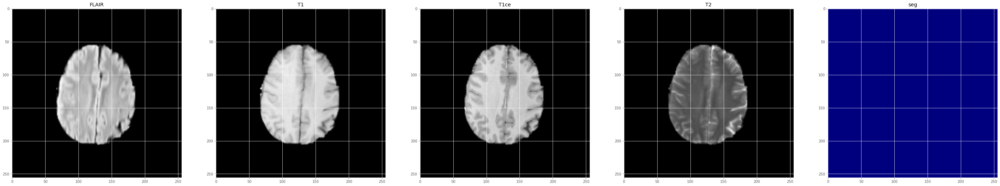

In [10]:
img_orig, label   = next(iter(val_dataloader))
img= torch.moveaxis(img_orig,1,-1)
print(f"Image batch shape: {img.shape}")
print(f"Label batch shape: {label.shape}")
ind = 5
fig, ax = plt.subplots(1,5, figsize=(50,10));
ax[0].imshow(img[ind,0,:,:], cmap='gray'), ax[0].set_title('FLAIR');
ax[1].imshow(img[ind,1,:,:], cmap='gray'), ax[1].set_title('T1');
ax[2].imshow(img[ind,2,:,:], cmap='gray'), ax[2].set_title('T1ce');
ax[3].imshow(img[ind,3,:,:], cmap='gray'), ax[3].set_title('T2');
ax[4].imshow(label[ind,:,:], cmap='jet'), ax[4].set_title('seg');

In [11]:
def conv_layer(input_channels, output_channels):     #This is a helper function to create the convolutional blocks
  conv = nn.Sequential(
        nn.Conv2d(input_channels, output_channels, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(output_channels, output_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(output_channels),
        nn.ReLU(inplace=True))
  return conv

In [12]:
class UNet(nn.Module):
    def __init__(self,in_channel=4):
        super(UNet, self).__init__()
        
        
        self.down_1 = conv_layer(in_channel, 8)
        self.max_pool_1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down_2 = conv_layer(8, 16)
        self.max_pool_2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down_3 = conv_layer(16, 32)
        self.max_pool_3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down_4 = conv_layer(32, 64)
        self.max_pool_4 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.down_5 = conv_layer(64, 128)
      
        
        self.up_1 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=2, stride=2)
        self.up_conv_1 = conv_layer(128, 64)
        self.up_2 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=2, stride=2)
        self.up_conv_2 = conv_layer(64, 32)
        self.up_3 = nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=2, stride=2)
        self.up_conv_3 = conv_layer(32, 16)
        self.up_4 = nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=2, stride=2)
        self.up_conv_4 = conv_layer(16,8)
        
        self.output = nn.Conv2d(in_channels=8, out_channels=1, kernel_size=1, padding=0)
        self.output_activation = nn.Sigmoid()

                
    def forward(self, img):     #The print statements can be used to visualize the input and output sizes for debugging
        img = torch.moveaxis(img,1,-1)
        x1 = self.down_1(img)
        x2 = self.max_pool_1(x1)
        x3 = self.down_2(x2)
        x4 = self.max_pool_2(x3)
        x5 = self.down_3(x4)
        x6 = self.max_pool_3(x5)
        x7 = self.down_4(x6)
        x8 = self.max_pool_4(x7)
        x9 = self.down_5(x8)
        
        x = self.up_1(x9)
        x = self.up_conv_1(torch.cat([x, x7], 1))
        x = self.up_2(x)
        x = self.up_conv_2(torch.cat([x, x5], 1))
        x = self.up_3(x)
        x = self.up_conv_3(torch.cat([x, x3], 1))
        x = self.up_4(x)
        x = self.up_conv_4(torch.cat([x, x1], 1))

        x = self.output(x)
        x = self.output_activation(x)

        
        return x

In [15]:
# def dice_loss(pred, target):
#     smooth = 100

#     predf = pred.view(-1)
#     targetf = target.view(-1)
#     intersection = (predf * targetf).sum()
    
#     return 1 - ((2. * intersection + smooth) /
#               (predf.sum() + targetf.sum() + smooth))


def dice_loss(pred, target):
    """This definition generalize to real valued pred and target vector.
This should be differentiable.
    pred: tensor with first dimension as batch
    target: tensor with first dimension as batch
    """

    smooth = 1.

    # have to use contiguous since they may from a torch.view op
    iflat = pred.contiguous().view(-1)
    tflat = target.contiguous().view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(tflat * iflat)
    B_sum = torch.sum(tflat * tflat)
    
    return 1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )

In [13]:
#Initialize the model and optimizer

epochs = 100
lr = 0.0001

model = UNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=lr, betas=(0.9,0.999))
out_img = model(img_orig.float().to(device))
print(out_img.shape)
# print(out_img[0])

torch.Size([32, 1, 256, 256])
tensor([[[0.4743, 0.4696, 0.4583,  ..., 0.4637, 0.4437, 0.4588],
         [0.5527, 0.4813, 0.5144,  ..., 0.4894, 0.4964, 0.4596],
         [0.5209, 0.5343, 0.4885,  ..., 0.5202, 0.5003, 0.4842],
         ...,
         [0.5709, 0.5216, 0.5078,  ..., 0.4946, 0.5424, 0.4748],
         [0.5220, 0.5583, 0.4901,  ..., 0.5213, 0.4818, 0.4896],
         [0.5682, 0.5247, 0.5025,  ..., 0.4757, 0.4981, 0.4716]]],
       grad_fn=<SelectBackward0>)


In [20]:
def train(model, epochs):
    #Keep track of average training and validation losses for each epoch
    avg_train_losses = []
    avg_val_losses = []
    #Trigger for earlystopping
    # earlystopping = False 

    #Training loop
    for epoch in range(epochs):
        
        #Record the training and validation losses for each batch in this epoch
        train_losses = []
        val_losses = []

        model.train()

        for batch_idx, data_input in enumerate(train_dataloader):
            train_img = data_input[0].to(device)
            label_img = data_input[1].to(device)

            optimizer.zero_grad()
            pred = model(train_img.float())
            loss = dice_loss(pred.squeeze(), label_img.float())
            loss.backward()
            optimizer.step()
            
            train_losses.append(loss.item())

                        
        with torch.no_grad():     #Show some samples at the first batch of each epoch 
          if epoch%1 == 0:
              #model.eval()
              torch.save(model, f'/content/drive/MyDrive/Brats2018/checkpoint_model_epoch_{epoch+1}.pth.tar')
              (img, label) = next(iter(val_dataloader))
              img_vis = torch.moveaxis(img,1,-1)
              pred = model(img.float())
              print(f"Epoch : {epoch}")
              ind = 14
              fig, ax = plt.subplots(1,6, figsize=(50,10))
              ax[0].imshow(img_vis[ind,0,:,:], cmap='gray'), ax[0].set_title('FLAIR')
              ax[1].imshow(img_vis[ind,1,:,:], cmap='gray'), ax[1].set_title('T1')
              ax[2].imshow(img_vis[ind,2,:,:], cmap='gray'), ax[2].set_title('T1ce')
              ax[3].imshow(img_vis[ind,3,:,:], cmap='gray'), ax[3].set_title('T2')
              ax[4].imshow(label[ind,:,:], cmap='jet'), ax[4].set_title('seg')
              ax[5].imshow(pred[ind,0,:,:], cmap='jet'), ax[5].set_title('seg')
              plt.show()
              

        
        with torch.no_grad():     #Record and print average validation loss for each epoch
            model.eval() 
            for batch_idx, val_data_input in enumerate(val_dataloader):
                val_img = val_data_input[0].to(device)
                val_label_img = val_data_input[1].to(device)
                val_pred = model(val_img.float().detach())

                val_loss = dice_loss(val_pred.squeeze(), val_label_img.float()).item()

                val_losses.append(val_loss)

            epoch_avg_train_loss = np.average(train_losses)
            epoch_avg_val_loss = np.average(val_losses)
            avg_train_losses.append(epoch_avg_train_loss)
            avg_val_losses.append(epoch_avg_val_loss)

            print_msg = (f'Epoch: {epoch} ' + f'train_loss: {epoch_avg_train_loss:.5f} ' + f'valid_loss: {epoch_avg_val_loss:.5f}')

            print(print_msg)
        
        # if epoch > 50:     #Early stopping with a patience of 1 and a minimum of 5 epochs 
        #     if avg_val_losses[-1]>=avg_val_losses[-2]:
        #         print("Early Stopping Triggered With Patience 1")
        #         torch.save(model, f'/content/drive/MyDrive/Brats2018/checkpoint_model_epoch_{epoch+1}.pth.tar')
        #         earlystopping = True 
        # if earlystopping:
        #     break

    return  model, avg_train_losses, avg_val_losses

Epoch : 0


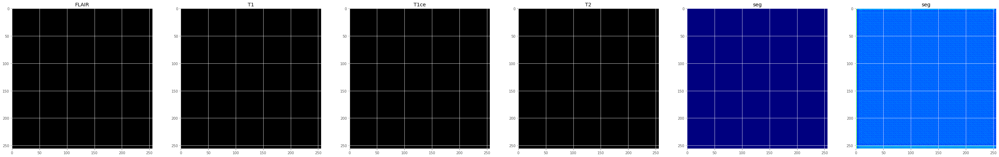

Epoch: 0.00train_loss: 0.00602 valid_loss: -0.00889
Epoch : 1


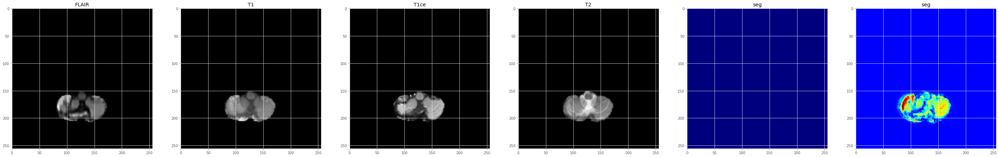

Epoch: 1.00train_loss: 0.00362 valid_loss: -0.00859
Epoch : 2


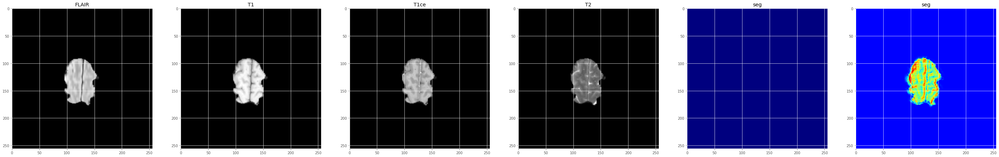

Epoch: 2.00train_loss: 0.00189 valid_loss: -0.01061
Epoch : 3


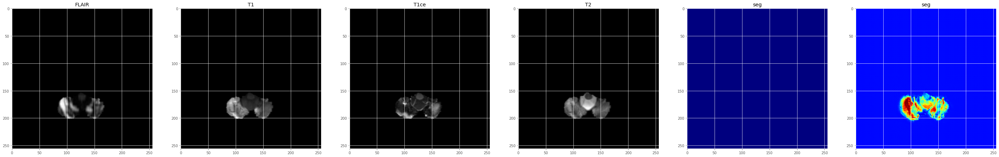

Epoch: 3.00train_loss: 0.00031 valid_loss: -0.01152
Epoch : 4


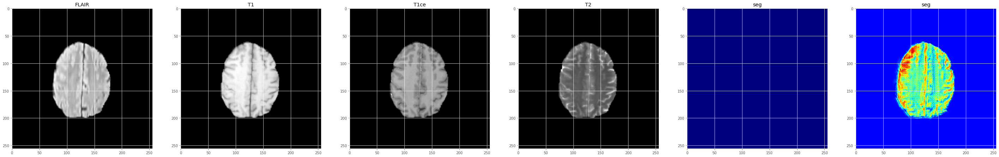

Epoch: 4.00train_loss: -0.00142 valid_loss: -0.01160
Epoch : 5


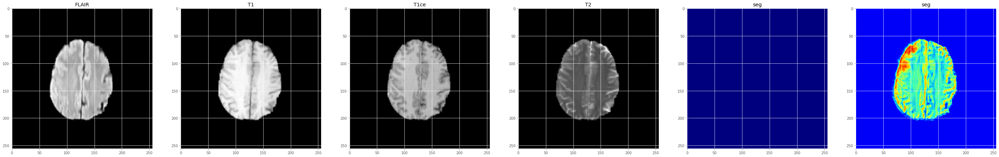

Epoch: 5.00train_loss: -0.00277 valid_loss: -0.01240
Epoch : 6


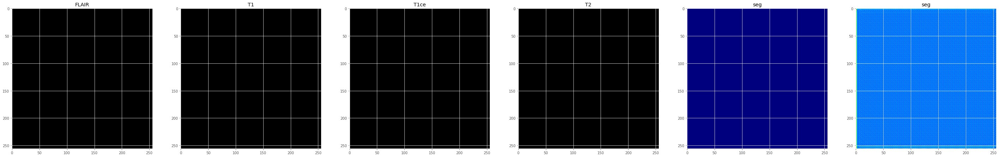

Epoch: 6.00train_loss: -0.00369 valid_loss: -0.01207
Epoch : 7


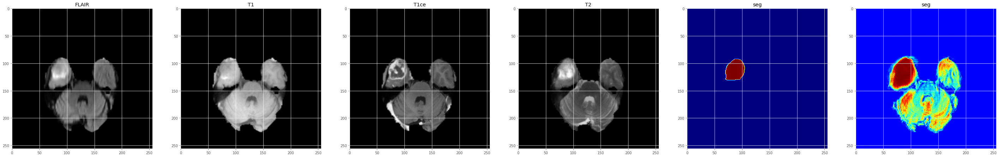

Epoch: 7.00train_loss: -0.00472 valid_loss: -0.01221
Epoch : 8


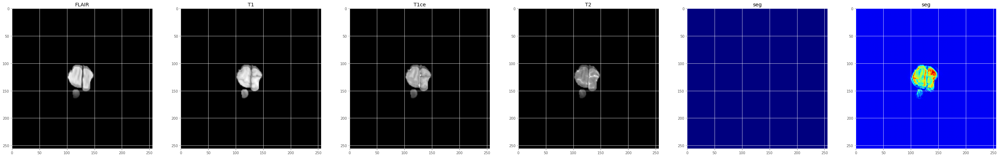

Epoch: 8.00train_loss: -0.00529 valid_loss: -0.01160
Epoch : 9


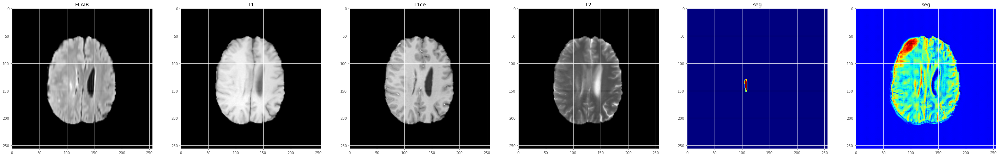

Epoch: 9.00train_loss: -0.00591 valid_loss: -0.01228
Epoch : 10


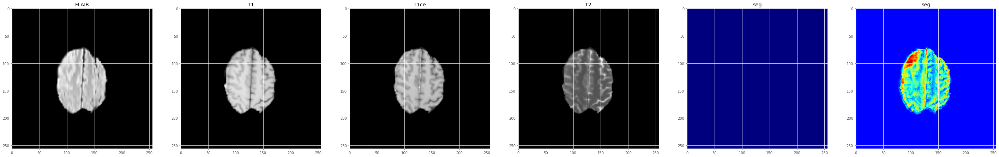

Epoch: 10.00train_loss: -0.00632 valid_loss: -0.01161
Epoch : 11


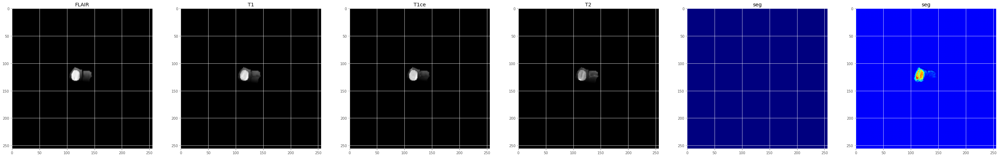

Epoch: 11.00train_loss: -0.00663 valid_loss: -0.01232
Epoch : 12


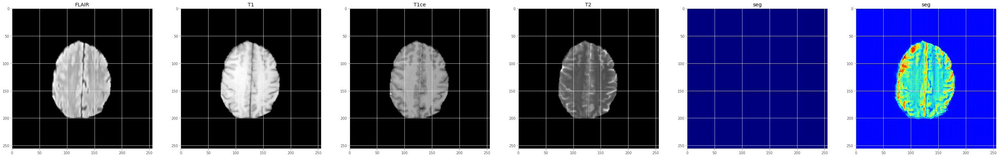

Epoch: 12.00train_loss: -0.00678 valid_loss: -0.01205
Epoch : 13


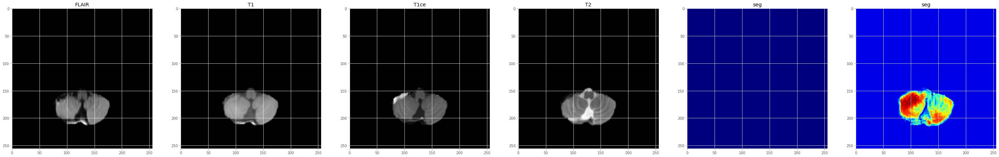

Epoch: 13.00train_loss: -0.00711 valid_loss: -0.01233
Epoch : 14


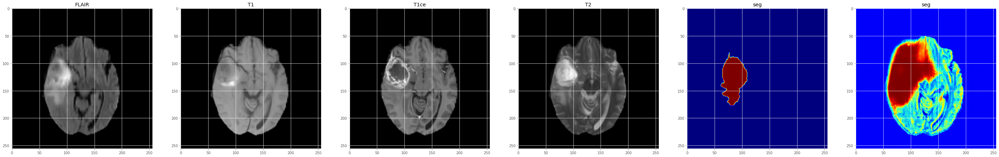

Epoch: 14.00train_loss: -0.00743 valid_loss: -0.01218
Epoch : 15


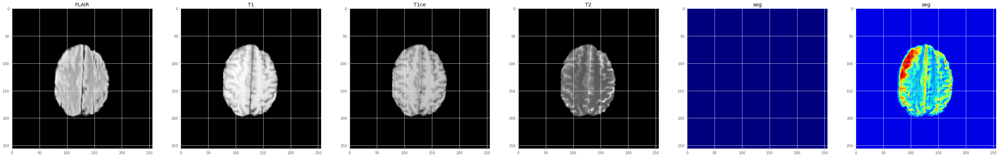

Epoch: 15.00train_loss: -0.00745 valid_loss: -0.01174
Epoch : 16


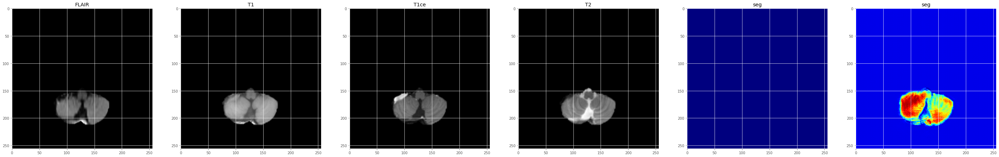

Epoch: 16.00train_loss: -0.00775 valid_loss: -0.01236
Epoch : 17


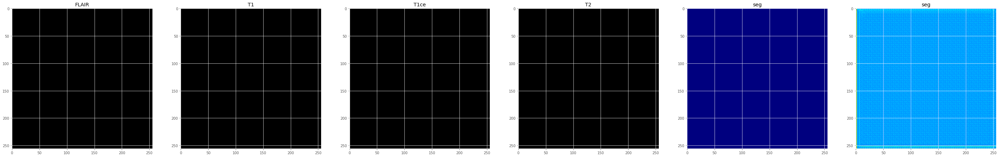

Epoch: 17.00train_loss: -0.00814 valid_loss: -0.01214
Epoch : 18


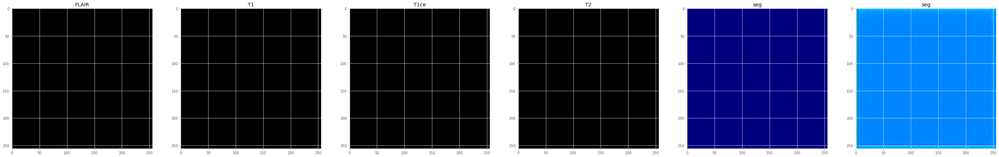

Epoch: 18.00train_loss: -0.00812 valid_loss: -0.01210
Epoch : 19


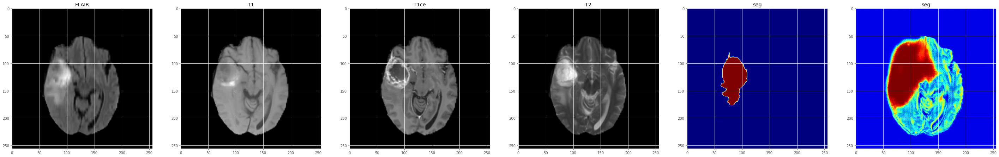

Epoch: 19.00train_loss: -0.00830 valid_loss: -0.01266
Epoch : 20


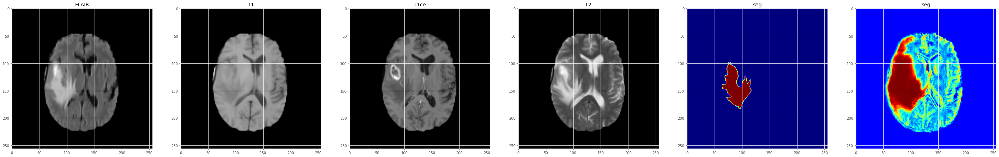

Epoch: 20.00train_loss: -0.00851 valid_loss: -0.01240
Epoch : 21


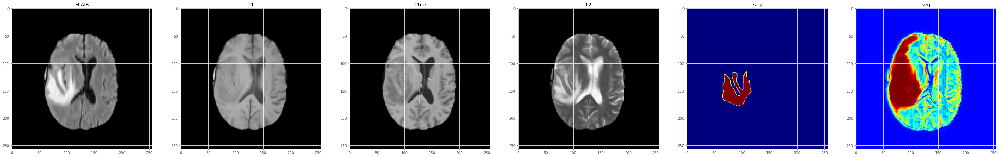

Epoch: 21.00train_loss: -0.00892 valid_loss: -0.01236
Epoch : 22


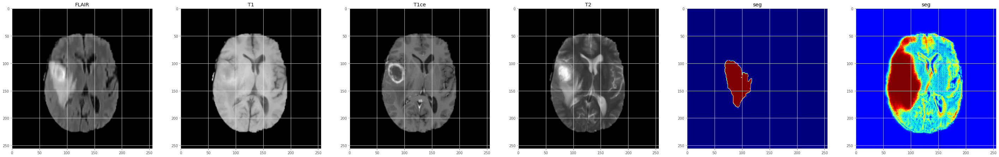

Epoch: 22.00train_loss: -0.00880 valid_loss: -0.01218
Epoch : 23


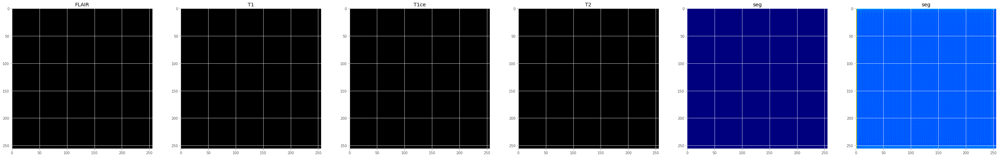

Epoch: 23.00train_loss: -0.00894 valid_loss: -0.01238
Epoch : 24


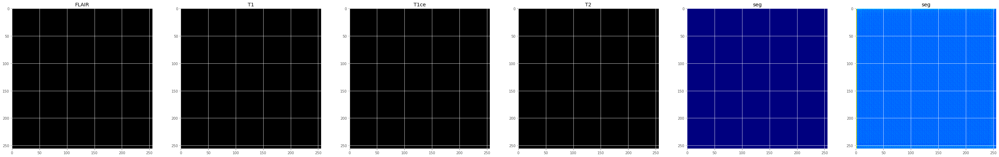

Epoch: 24.00train_loss: -0.00896 valid_loss: -0.01233
Epoch : 25


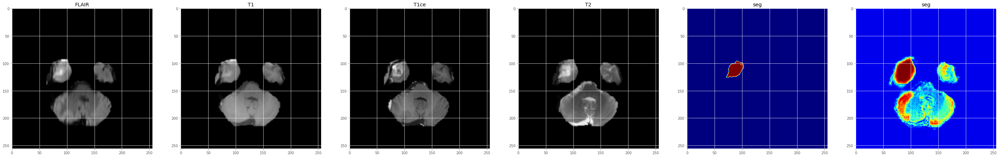

Epoch: 25.00train_loss: -0.00915 valid_loss: -0.01247
Epoch : 26


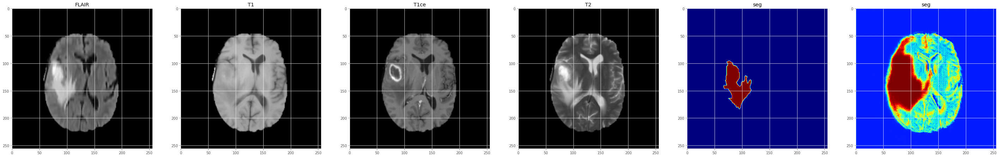

Epoch: 26.00train_loss: -0.00894 valid_loss: -0.01252
Epoch : 27


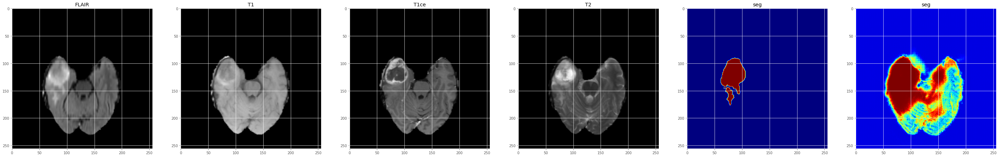

Epoch: 27.00train_loss: -0.00907 valid_loss: -0.01229
Epoch : 28


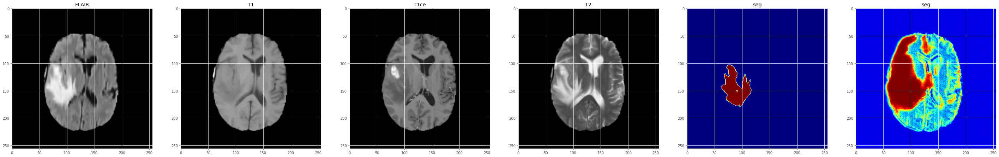

Epoch: 28.00train_loss: -0.00915 valid_loss: -0.01243
Epoch : 29


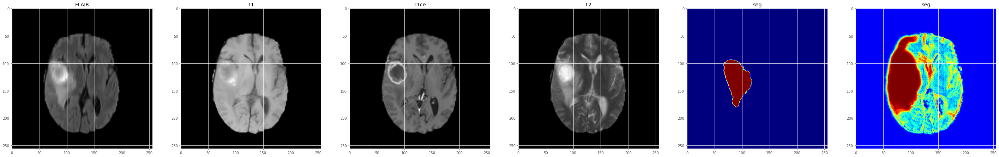

Epoch: 29.00train_loss: -0.00930 valid_loss: -0.01238
Epoch : 30


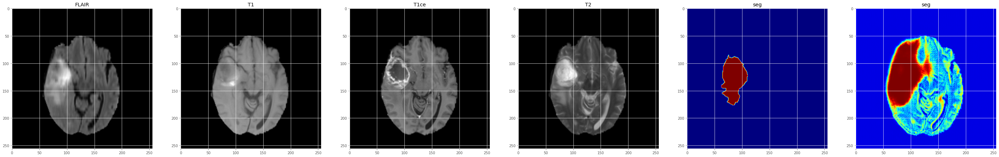

Epoch: 30.00train_loss: -0.00928 valid_loss: -0.01241
Epoch : 31


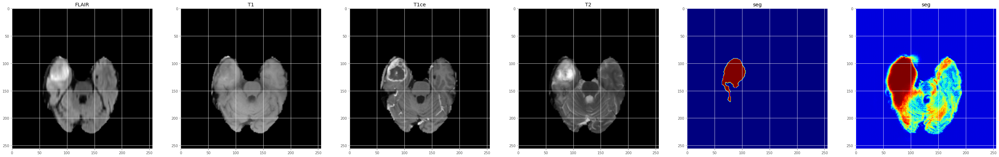

Epoch: 31.00train_loss: -0.00920 valid_loss: -0.01234
Epoch : 32


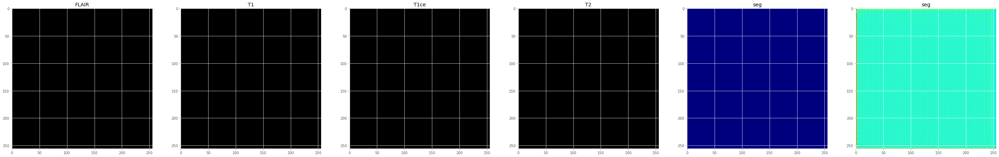

Epoch: 32.00train_loss: -0.00932 valid_loss: -0.01249
Epoch : 33


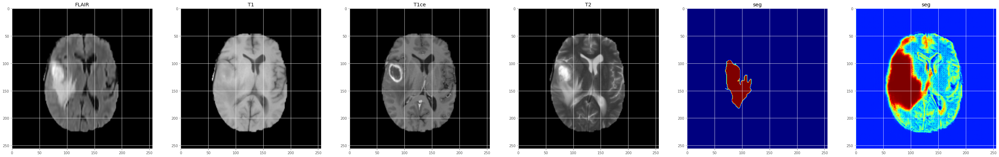

Epoch: 33.00train_loss: -0.00941 valid_loss: -0.01225
Epoch : 34


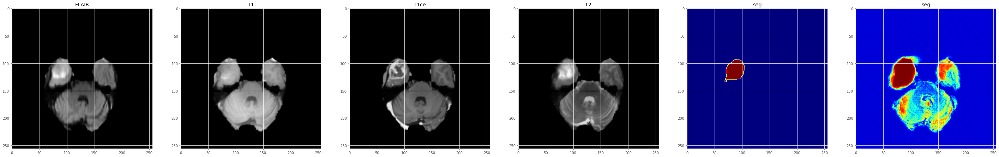

Epoch: 34.00train_loss: -0.00938 valid_loss: -0.01257
Epoch : 35


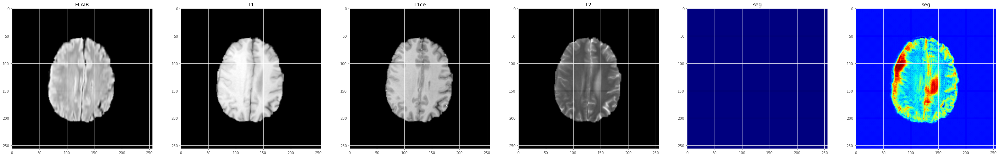

Epoch: 35.00train_loss: -0.00959 valid_loss: -0.01259
Epoch : 36


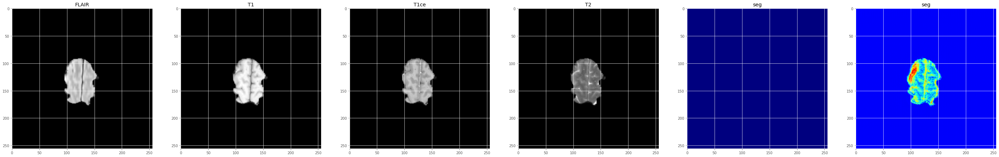

Epoch: 36.00train_loss: -0.00942 valid_loss: -0.01236
Epoch : 37


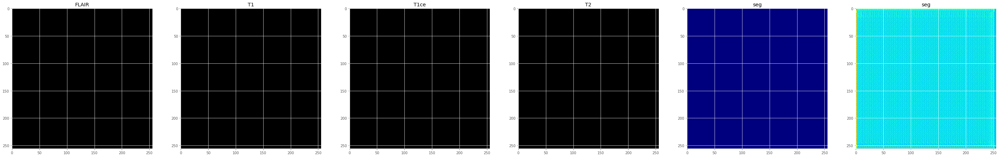

Epoch: 37.00train_loss: -0.00948 valid_loss: -0.01204
Epoch : 38


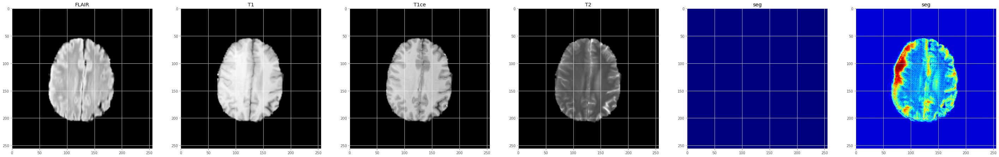

Epoch: 38.00train_loss: -0.00954 valid_loss: -0.01252
Epoch : 39


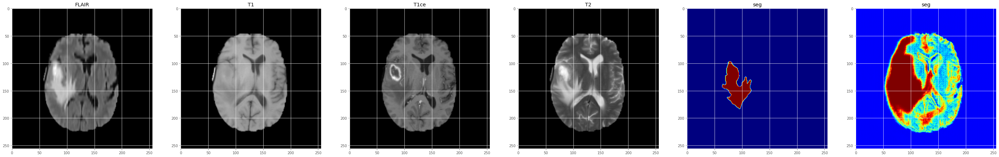

Epoch: 39.00train_loss: -0.00942 valid_loss: -0.01250
Epoch : 40


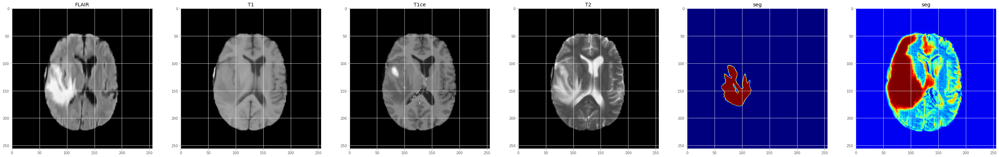

Epoch: 40.00train_loss: -0.00948 valid_loss: -0.01229
Epoch : 41


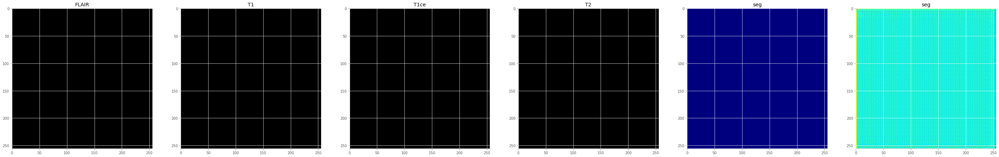

Epoch: 41.00train_loss: -0.00963 valid_loss: -0.01252
Epoch : 42


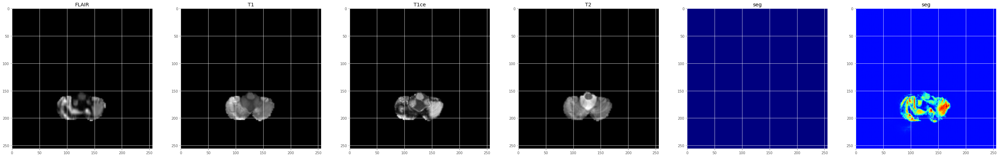

Epoch: 42.00train_loss: -0.00950 valid_loss: -0.01246
Epoch : 43


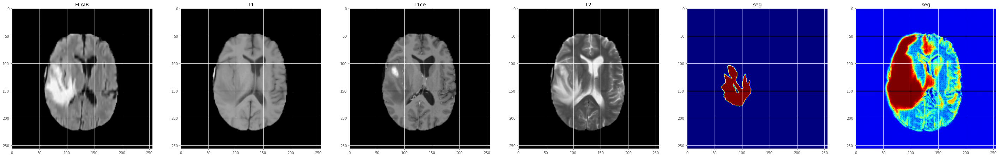

Epoch: 43.00train_loss: -0.00954 valid_loss: -0.01223
Epoch : 44


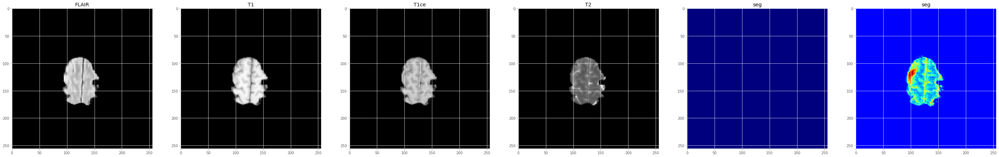

Epoch: 44.00train_loss: -0.00943 valid_loss: -0.01245
Epoch : 45


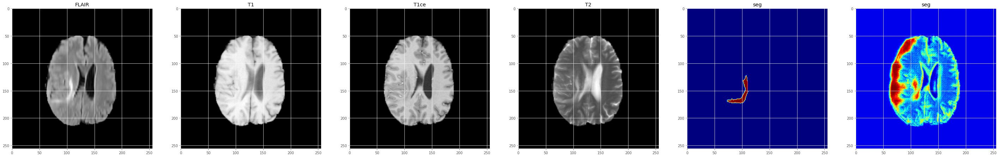

Epoch: 45.00train_loss: -0.00966 valid_loss: -0.01256
Epoch : 46


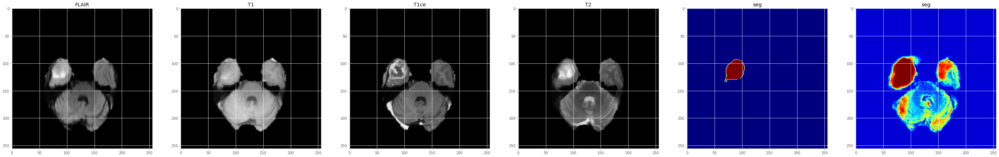

Epoch: 46.00train_loss: -0.00951 valid_loss: -0.01237
Epoch : 47


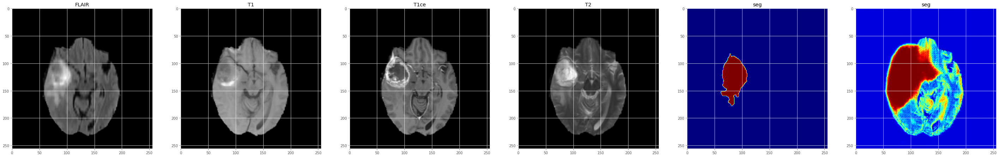

Epoch: 47.00train_loss: -0.00953 valid_loss: -0.01235
Epoch : 48


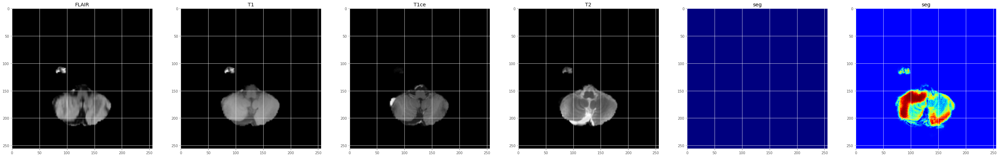

Epoch: 48.00train_loss: -0.00953 valid_loss: -0.01245
Epoch : 49


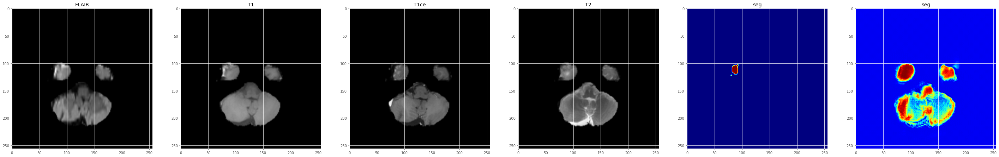

Epoch: 49.00train_loss: -0.00987 valid_loss: -0.01231
Epoch : 50


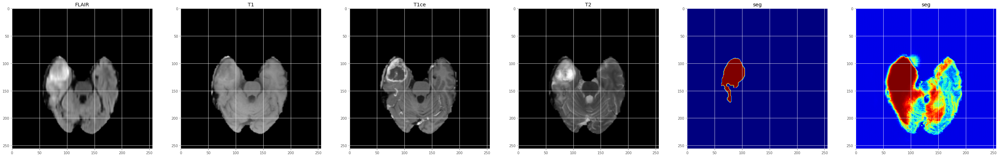

Epoch: 50.00train_loss: -0.00958 valid_loss: -0.01269
Epoch : 51


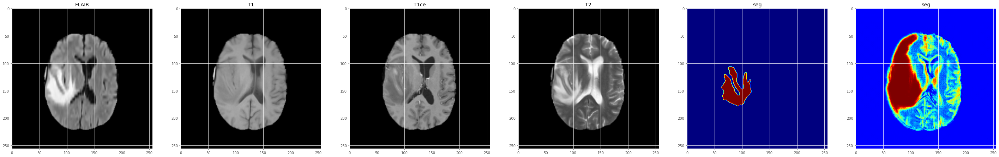

Epoch: 51.00train_loss: -0.01000 valid_loss: -0.01239
Early Stopping Triggered With Patience 1


In [21]:
best_model, avg_train_losses, avg_val_losses = train(model, epochs)